# 🟢 **XXII Semana do Meio Ambiente | LAMAR | Manipulação de Mapas**

*Este material aborda uma introdução ao uso de Python para análise e visualização de dados geoespaciais.*

*Elaborado e apresentado por Giovanna Maciel Baudenbacher, Erik Carlo Gonçalves e Kaique Anthony Walter de Oliveira.*

***<font color="lightgreen">Salve uma cópia no seu Drive!</font>***

---

### ⚪ **SUMÁRIO**

> [**Módulo 1** - Justificativa e proposta do curso](#scrollTo=S9gLzOcmAmiw&line=1&uniqifier=1)

> [**Módulo 2** - Ambiente e bibliotecas essenciais](#scrollTo=5060gF9UGA_D&line=1&uniqifier=1)

> [**Módulo 3** - GeoPandas](#scrollTo=KeT7yCu6K9l7&line=1&uniqifier=1)

>> [**3.1.** Introdução](#scrollTo=UnTypWA2h7PF&line=1&uniqifier=1)

>> [**3.2.** Sistemas de Coordenadas](#scrollTo=U7v-loUiia9_&line=1&uniqifier=1)

>> [**Verificação de Aprendizado** - Exercício 1](#scrollTo=ZrhEl7QkwKV1&line=1&uniqifier=1)

>> [**3.3.** Mapas Coropléticos](#scrollTo=ZrhEl7QkwKV1&line=1&uniqifier=1)

>> [**3.4.** Breve introdução aos mapas interativos](#scrollTo=JiI-qD6tyjsE&line=1&uniqifier=1)

> [**Módulo 4** - Folium](#scrollTo=7TCQ8RivbvpZ&line=1&uniqifier=1)

>> [**4.1.** Mapas simples e marcadores](#scrollTo=AG2cXMPu96Ri&line=1&uniqifier=1)

>> [**4.2.** Mapas coropléticos](#scrollTo=EL_Wfd12-B57&line=1&uniqifier=1)

>> [**4.3.** Outras visualizações](#scrollTo=-STg9EGV-NmZ&line=1&uniqifier=1)

> [**Acesse nosso site**](#scrollTo=FM9fSOlVRqD3&line=2&uniqifier=1)

> [**Referências**](#scrollTo=cmahWReRGSWP&line=3&uniqifier=1)

### 🌐 **Módulo 1 - Justificativa e proposta do curso**

#### **Por que usar Python?**

Durante o curso de Engenharia Ambiental, adquire-se formação no uso de **ArcGIS e ArcMAP**, ferramentas consolidadas no mercado de trabalho. Este minicurso propõe complementar essa formação com Python para análise e visualização de dados espaciais, de modo introdutório, ampliando o conjunto de competências técnicas aluno.

 A manipulação de mapas por Python pode abrir novos horizontes para projetos que exigem multiplos mapas com multiplos temas sendo por meio da automação ou da replicação facilitada que a programação oferece.

 Em casos de integração com sites, que utilizam linguagem em HTML, a programação é bem vinda por oferecer mapas interativos em tempo real, atualização das informações e layout diverso.

A tabela a seguir compara as duas abordagens, destacando alguns cenários em que Python apresenta vantagens:

| Critério | ArcGIS / ArcMAP | Python (GeoPandas, Folium) |
|---|---|---|
| Licença e acessibilidade | Envolvem custo elevado | Gratuito e open-source em qualquer contexto |
| Automação e repetibilidade | Ferramentas manuais; complexidade para processos repetitivos | Código como documentação; automação facilitada; ideal para pipelines |
| Mapas interativos para web | Funcionalidade através de ArcGIS Online (custo adicional) | Folium exporta mapas HTML interativos sem custo |
| Reprodutibilidade científica | Dependente de sequência de cliques; maior complexidade para rastreamento | Código como registro auditável e rastreável |

> **Este minicurso não se posiciona como substituto de ArcGIS/ArcMAP**, mas como complemento à formação do engenheiro ambiental. A proposta é expandir o repertório técnico, principalmente para projetos que exigem reprodutibilidade e que contêm restrições orçamentárias.

### 🌐 **Módulo 2 - Ambiente e bibliotecas essenciais**

Para futuras implementações, recomenda-se a utilização do ambiente *Visual Studio Code* (*VS Code*).

**Principais Bibliotecas para Geoprocessamento**

| Biblioteca | Funcionalidade | Equivalência ArcGIS | Observações |
|---|---|---|---|
| **GeoPandas** | Leitura, manipulação e análise de dados vetoriais (Shapefile, GeoJSON, GeoPackage) | Tabela de Atributos + Ferramentas de Análise Vetorial | Integra geometria e atributos em um único objeto; utiliza a biblioteca Fiona|
| **Shapely** | Criação e manipulação de geometrias (Point, LineString, Polygon) | Geometrias do ArcGIS | Permite operações geométricas (buffer, intersect) |
| **Fiona** | Leitura e tradução de arquivos geoespaciais | - | Compatível com Shapefile, GeoJSON, GeoPackage, KML, entre outros |
| **Folium** | Geração de mapas interativos em HTML | ArcGIS Online | Baseado em Leaflet.js; exporta como arquivo HTML independente |
| **Matplotlib** | Visualização cartográfica estática; geração e customização de gráficos e mapas temáticos | Layout | Integração direta com GeoPandas |
| **Contextily** | Integração de mapas base (OpenStreetMap, Stamen, CartoDB, Esri) | Basemaps | Adição de contexto geográfico |
| **Rasterio** | Leitura, escrita e processamento de dados matriciais (raster); imagens de satélite e MDE | Ferramentas Raster do ArcGIS; Spatial Analyst | Suporte a GeoTIFF, HDF5, NetCDF |

**Notas**

- As bibliotecas são independentes, mas frequentemente são utilizadas em conjunto;
- Todas possuem documentação e comunidade ativa (atualizações regulares);
- A escolha entre bibliotecas depende da natureza do dado (vetorial x raster) e do objetivo da análise (estática x interativa).

In [1]:
# No Google Colab, das bibliotecas que serão usadas, apenas contextily precisa ser instalado manualmente
# As demais já vêm pré-instaladas no ambiente Colab
!pip install -qq contextily

In [2]:
# Importação das bibliotecas necessárias para este minicurso

# Dados e geometrias
import geopandas as gpd
import pandas as pd
import numpy as np
from shapely.geometry import Point, LineString

# Visualização estática
import matplotlib.pyplot as plt

# Mapas interativos
import folium
from folium import plugins
from folium.plugins import HeatMap, MiniMap, Fullscreen, MousePosition, FastMarkerCluster

### 🌐 **Módulo 3 - GeoPandas**

#### ⚪ **3.1. Introdução**

A biblioteca `geopandas` consiste em uma extensão da biblioteca `pandas`, desenvolvida com o objetivo de facilitar a manipulação de dados georreferenciados.



**O que é um GeoDataFrame?**

* No ArcMAP: tabela de atributos com as informações e, separadamente, o mapa com as geometrias.
* Em Python: **GeoDataFrame**, um DataFrame do Pandas com uma coluna `geometry` que armazena as geometrias. Herda as funcionalidades do `pandas.DataFrame`.

In [3]:
# URL de GeoJSON público de estados do Brasil
# Estamos acessando por URL do GitHub para facilitar, mas você pode importar seus próprios arquivos!
URL_ESTADOS = "https://raw.githubusercontent.com/codeforamerica/click_that_hood/master/public/data/brazil-states.geojson"

# Leitura dos dados via URL
gdf_estados = gpd.read_file(URL_ESTADOS)

# Inspecionar o GeoDataFrame
print(f"Tipo do objeto:\t\t{type(gdf_estados)}")
print(f"Número de estados:\t{len(gdf_estados)}")
print(f"Colunas disponíveis:\t{list(gdf_estados.columns)}")
print(f"Sistema de coordenadas:\t{gdf_estados.crs}") # crs = Coordinate Reference System
print(f"Tipo de geometria:\t{gdf_estados.geom_type.unique()}\n")

Tipo do objeto:		<class 'geopandas.geodataframe.GeoDataFrame'>
Número de estados:	27
Colunas disponíveis:	['id', 'name', 'sigla', 'regiao_id', 'codigo_ibg', 'cartodb_id', 'created_at', 'updated_at', 'geometry']
Sistema de coordenadas:	EPSG:4326
Tipo de geometria:	['MultiPolygon']



A informação sobre o sistema de coordenadas aparece como o código do banco de dados do [European Petroleum Survey Group (EPSG)](https://epsg.io), usado para identificar sistemas de referência de coordenadas (CRS).

No caso, 4326 é o identificador do EPSG para WGS84 (World Geodetic System 1984). Mais exemplos:

| CRS | EPSG | Situação de uso |
|---|---|---|
| **WGS84** | 4326 | GPS e Folium |
| **SIRGAS 2000 / UTM 23S** | 31983 | São Paulo-SP, Sorocaba-SP |
| **SIRGAS 2000 / UTM 22S** | 31982 | Ilha Solteira-SP, Tupã-SP |

<img src="https://geoone.com.br/wp-content/uploads/2022/05/Fusos-e-hemisferios-da-projecao-UTM-para-o-Brasil.jpg" width="50%">

Fonte: [GeoOne](https://geoone.com.br/qual-src-devo-utilizar-em-meu-mapa/), 2022.

In [4]:
# Visualização do GeoDataFrame
gdf_estados.head()

,id,name,sigla,regiao_id,codigo_ibg,cartodb_id,created_at,updated_at,geometry
0,1,Acre,AC,3,12,1,2015-02-09 16:46:01+00:00,2015-02-09 16:46:01+00:00,"MULTIPOLYGON (((-73.60818 -7.20194, -72.86963 ..."
1,2,Alagoas,AL,4,27,2,2015-02-09 16:46:01+00:00,2015-02-09 16:46:01+00:00,"MULTIPOLYGON (((-35.46516 -8.82549, -35.46626 ..."
2,3,Amazonas,AM,3,13,3,2015-02-09 16:46:01+00:00,2015-02-09 16:46:01+00:00,"MULTIPOLYGON (((-67.32553 2.03012, -67.32234 2..."
3,4,Amapá,AP,3,16,4,2015-02-09 16:46:01+00:00,2015-02-09 16:46:01+00:00,"MULTIPOLYGON (((-51.18168 4.00889, -51.179 3.9..."
4,5,Bahia,BA,4,29,5,2015-02-09 16:46:01+00:00,2015-02-09 16:46:01+00:00,"MULTIPOLYGON (((-39.2882 -8.5629, -39.28229 -8..."


Trabalhando com dados espaciais, é interessante explorar os dados utilizando um mapa. Para criar mapas estáticos, usamos a própria `matplotlib`, que é normalmente utilizada para gerar gráficos!

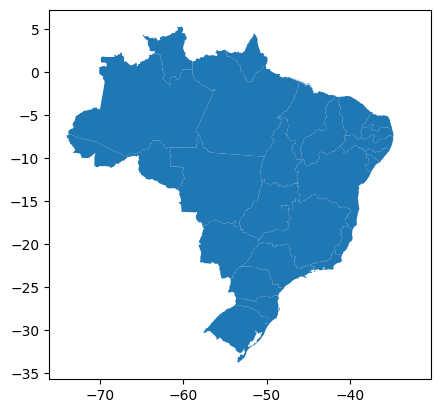

In [5]:
# Visualização rápida
gdf_estados.plot()
plt.show()

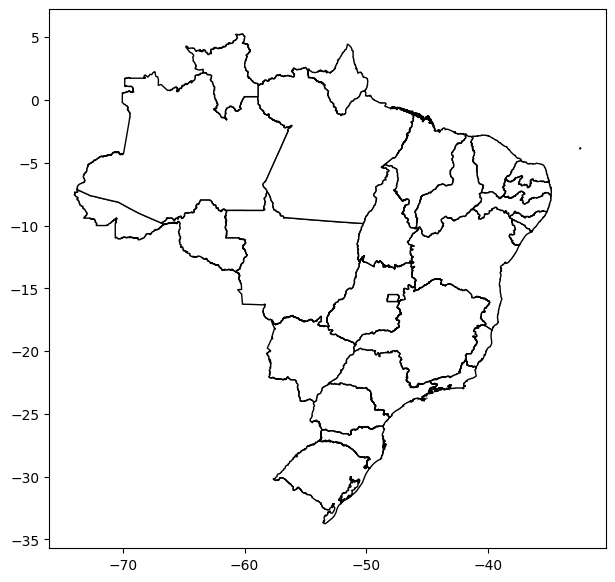

In [6]:
# Alterando a visualização com matplotlib
gdf_estados.plot(figsize=(8, 7), facecolor='white', edgecolor='black')
plt.show()

Além disso, é possível realizar a seleção (ou filtragem) de polígonos em um GeoDataFrame utilizando operações semelhantes às aplicadas em DataFrames da biblioteca *pandas*.

In [7]:
# Recortar o polígono do estado de São Paulo
gdf_sp = gdf_estados[gdf_estados['name'] == 'São Paulo']

# Visualizar o resultado
gdf_sp

,id,name,sigla,regiao_id,codigo_ibg,cartodb_id,created_at,updated_at,geometry
24,26,São Paulo,SP,2,35,26,2015-02-09 16:46:01+00:00,2015-02-09 16:46:01+00:00,"MULTIPOLYGON (((-46.13772 -23.85888, -46.13327..."


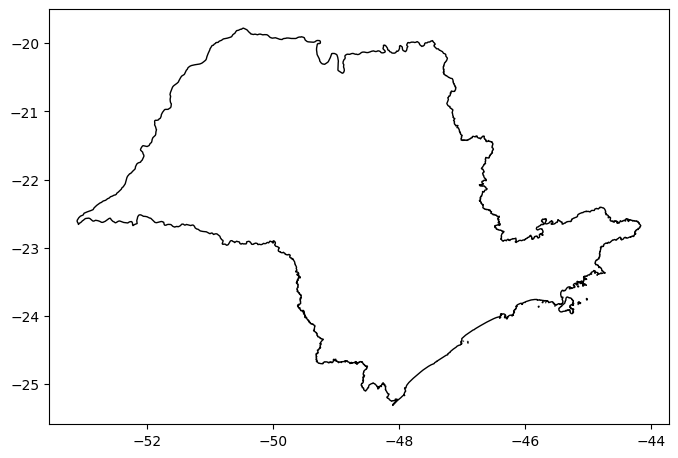

In [8]:
# Seguindo a mesma lógica de visualização rápida
gdf_sp.plot(figsize=(8, 7), facecolor='white', edgecolor='black')
plt.show()

#### ⚪ **3.2. Sistemas de Coordenadas**

**Por que reprojetar?**

- **Cálculos métricos** (área, distância, buffer) exigem coordenadas métricas;
- **WGS84** usa graus decimais. Por consequência, `gdf.area` retornaria graus², que não tem significado, por exemplo;
- **Folium** exige WGS84 (EPSG:4326);
- Mas há bibliotecas, como a **Contextily**, que exigem Pseudo-Mercator (EPSG:3857).

In [9]:
# Exibindo informações antes da reprojeção, para comparação
print('ANTES DA REPROJEÇÃO')
print(f"CRS: {gdf_estados.crs}")

# Reprojetar para SIRGAS 2000 UTM 23S (coordenadas métricas)
gdf_estados_utm = gdf_estados.to_crs(epsg=31983)

# Exibindo informações após a reprojeção
print("\nAPÓS REPROJEÇÃO")
print(f"CRS: {gdf_estados_utm.crs}")

ANTES DA REPROJEÇÃO
CRS: EPSG:4326

APÓS REPROJEÇÃO
CRS: EPSG:31983


In [10]:
# Criando coluna que armazena a área em km²
gdf_estados_utm['area_km2'] = gdf_estados_utm.area / (10**6)

# Quantos estados apresentam área maior que 300.000 km²?
estados_grandes = gdf_estados_utm[gdf_estados_utm['area_km2'] > 350000]
print(f"Municípios com área > 350.000 km²: {list(estados_grandes['name'])}")
print(f"Municípios com área > 350.000 km²: {len(estados_grandes)}")

Municípios com área > 350.000 km²: ['Amazonas', 'Bahia', 'Minas Gerais', 'Mato Grosso do Sul', 'Mato Grosso', 'Pará']
Municípios com área > 350.000 km²: 6


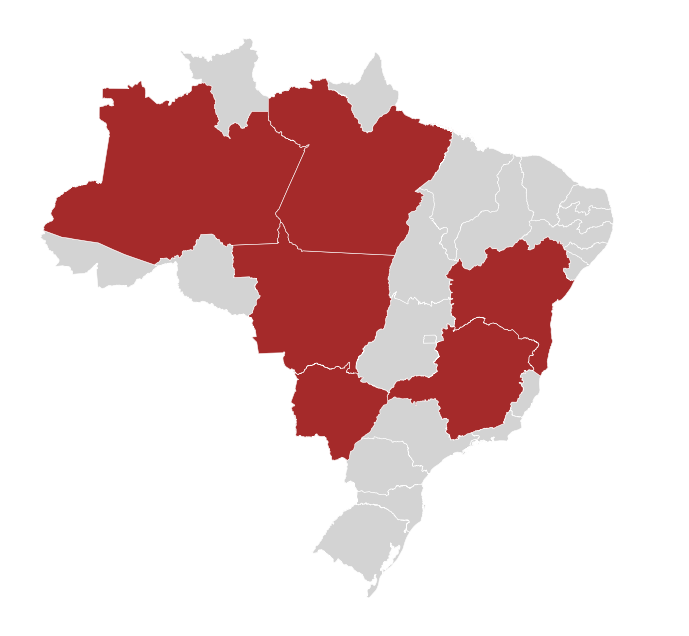

In [11]:
# Plotar
fig, ax = plt.subplots(figsize=(10, 8))
gdf_estados_utm.plot(ax=ax, color='lightgray', edgecolor='white', linewidth=0.4)
estados_grandes.plot(ax=ax, color='brown', edgecolor='white', linewidth=0.4)
ax.set_axis_off()
plt.show()

Outra aplicação de coordenadas métricas é para executar `buffer`.

**Situação exemplo:** Você está buscando estações meteorológicas no entorno de Sorocaba/SP para um Estudo de Chuvas Intensas. O cliente exigiu que a documentação apresentasse mapeamento das estações disponíveis nos raios de 15 km e 30km. Como apresentar rapidamente as regiões analisadas?

In [12]:
# URL com os limites municipais no estado de SP
URL_MUNICIPIOS_SP = "https://raw.githubusercontent.com/tbrugz/geodata-br/master/geojson/geojs-35-mun.json"

# Leitura dos dados
gdf_mun = gpd.read_file(URL_MUNICIPIOS_SP)

# Visualização
gdf_mun.head()

,id,name,description,geometry
0,3500105,Adamantina,Adamantina,"POLYGON ((-51.05787 -21.39888, -51.05365 -21.4..."
1,3500204,Adolfo,Adolfo,"POLYGON ((-49.65478 -21.20607, -49.63847 -21.2..."
2,3500303,Aguaí,Aguaí,"POLYGON ((-47.2089 -21.97129, -47.20297 -21.97..."
3,3500402,Águas da Prata,Águas da Prata,"POLYGON ((-46.70755 -21.82895, -46.7038 -21.84..."
4,3500501,Águas de Lindóia,Águas de Lindóia,"POLYGON ((-46.61147 -22.43496, -46.60302 -22.4..."


In [13]:
# Reprojetar para SIRGAS 2000 UTM 23S (coordenadas métricas)
gdf_mun_utm = gdf_mun.to_crs(epsg=31983)

# Obtendo o centróide do polígono de Sorocaba
centroide_sor = gdf_mun_utm[gdf_mun_utm['name'] == 'Sorocaba'].geometry.centroid.iloc[0]

# Criando um ponto no centróide de Sorocaba
sorocaba = gpd.GeoDataFrame({'nome': ['Sorocaba']},
                            geometry=[Point(centroide_sor.x, centroide_sor.y)],
                            crs='EPSG:31983'
                            )

# Visualização do GeoDataFrame
sorocaba

,nome,geometry
0,Sorocaba,POINT (250102.493 7402982.663)


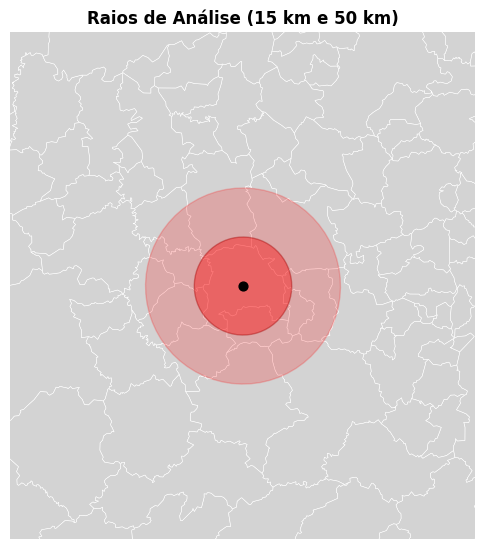

In [14]:
# Criando buffer de 15 km
buffer_15km = sorocaba.copy()
buffer_15km['geometry'] = sorocaba.buffer(15_000)

# Criando buffer de 30 km
buffer_30km = sorocaba.copy()
buffer_30km['geometry'] = sorocaba.buffer(30_000)

# Voltando para WGS84 apenas para visualização
sorocaba_wgs = sorocaba.to_crs(epsg=4326)
buffer_15km_wgs = buffer_15km.to_crs(epsg=4326)
buffer_30km_wgs = buffer_30km.to_crs(epsg=4326)

# Coordenadas do centróide de Sorocaba em WGS84
x = sorocaba_wgs.geometry.x.iloc[0]
y = sorocaba_wgs.geometry.y.iloc[0]
zoom = 0.7

# Visualização
fig, ax = plt.subplots(figsize=(6, 10))

gdf_mun.plot(ax=ax, color='lightgray', edgecolor='white', linewidth=0.4)
buffer_15km_wgs.plot(ax=ax, color='red', alpha=0.4, edgecolor='darkred')
buffer_30km_wgs.plot(ax=ax, color='red', alpha=0.2, edgecolor='red')
sorocaba_wgs.plot(ax=ax, color='black', markersize=40)

# Centralizando o mapa
ax.set_xlim(x - zoom, x + zoom)
ax.set_ylim(y - zoom, y + zoom)

ax.set_title('Raios de Análise (15 km e 50 km)', fontsize=12, fontweight='bold')
ax.set_axis_off()
plt.show()

#### ✍ **Verificação de Aprendizado** - Exercício 1

A variável `gdf_mun`, criada anteriormente, contém informações georreferenciadas dos municípios do estado de São Paulo.

Construa um visualização simples que destaque os municípios com Área > 1500 km².

In [15]:
# Espaço para sua resposta

#### ⚪ **3.3. Mapas Coropléticos**

In [33]:
# Lendo dados de saneamento básico (esgotamento sanitário)
URL_DATA = 'https://raw.githubusercontent.com/bamagi/sma-2026/refs/heads/main/data/esgoto_estados.csv'
data = pd.read_csv(URL_DATA, delimiter=';')

# Visualização rápida
data.head()

,estado,indice_coleta_esgoto,indice_tratamento_esgoto
0,Acre,20.96,98.09
1,Amapá,19.47,95.38
2,Amazonas,24.30,92.29
3,Pará,12.43,58.29
4,Rondônia,11.54,70.67


In [17]:
# Unindo geometria + dados do .csv

# As colunas de referência, que apresentam linhas iguais, tem nomes diferentes
# Por isso, o uso de left_on e right_on
merged = gdf_estados.merge(data, left_on='name', right_on='estado')

# Visualização do GeoDataFrame resultante
merged.head(2)

,id,name,sigla,regiao_id,codigo_ibg,cartodb_id,created_at,updated_at,geometry,estado,indice_coleta_esgoto,indice_tratamento_esgoto
0,1,Acre,AC,3,12,1,2015-02-09 16:46:01+00:00,2015-02-09 16:46:01+00:00,"MULTIPOLYGON (((-73.60818 -7.20194, -72.86963 ...",Acre,20.96,98.09
1,2,Alagoas,AL,4,27,2,2015-02-09 16:46:01+00:00,2015-02-09 16:46:01+00:00,"MULTIPOLYGON (((-35.46516 -8.82549, -35.46626 ...",Alagoas,19.08,85.61


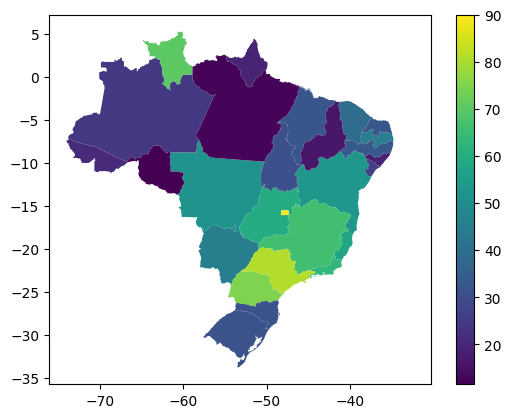

In [18]:
# Visualização rápida do Índice de Coleta de Esgoto em cada estado
merged.plot('indice_coleta_esgoto', legend=True)
plt.show()

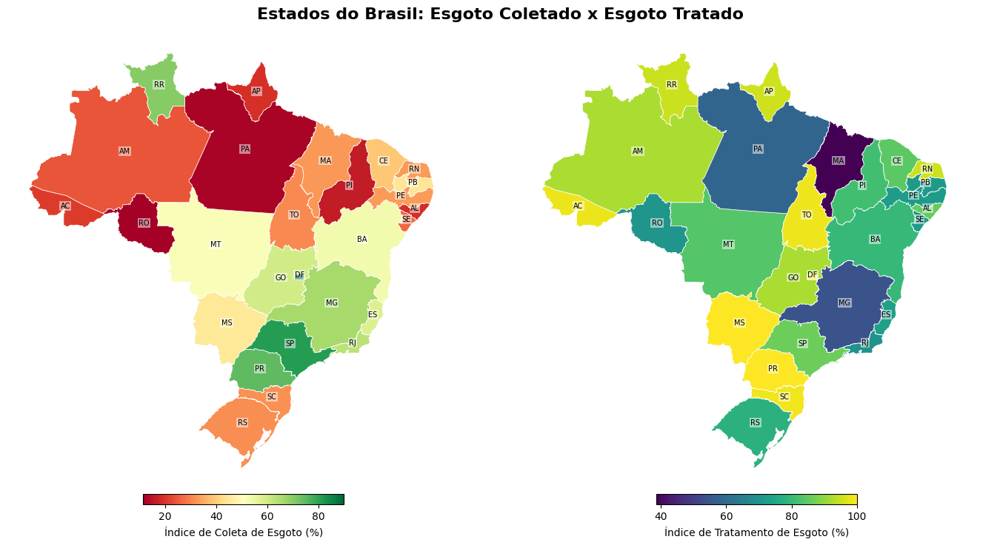

In [19]:
# Criando mapa coroplético mais completo
fig, axes = plt.subplots(1, 2, figsize=(14, 8))

# Primeiro mapa: Índice de Coleta de Esgoto por estado (%)
ax1 = axes[0]
merged.plot(ax=ax1,
            column='indice_coleta_esgoto',
            cmap='RdYlGn',
            legend=True,
            legend_kwds={'label': 'Índice de Coleta de Esgoto (%)', 'orientation': 'horizontal', 'shrink': 0.4, 'pad': 0.01},
            edgecolor='white',
            linewidth=0.5,
            )

# Adicionando rótulos
for idx, row in merged.iterrows():
    # Centroide do polígono
    x = row.geometry.centroid.x
    y = row.geometry.centroid.y
    # Caixas de texto
    ax1.text(x, y, row['sigla'],
            fontsize=7,
            ha='center',
            color='black',
            bbox=dict(facecolor='white', alpha=0.5, edgecolor='none', pad=1))

# Retirando eixos
ax1.set_axis_off()

# Segundo mapa: Índice de Tratamento de Esgoto por estado (%)
ax2 = axes[1]
merged.plot(ax=ax2,
            column='indice_tratamento_esgoto',
            legend=True,
            legend_kwds={'label': 'Índice de Tratamento de Esgoto (%)', 'orientation': 'horizontal', 'shrink': 0.4, 'pad': 0.01},
            edgecolor='white',
            linewidth=0.5
)

# Adicionando rótulos
for idx, row in merged.iterrows():
    # Centroide do polígono
    x = row.geometry.centroid.x
    y = row.geometry.centroid.y
    # Caixas de texto
    ax2.text(x, y, row['sigla'],
            fontsize=7,
            ha='center',
            color='black',
            bbox=dict(facecolor='white', alpha=0.5, edgecolor='none', pad=1))

# TRetirando eixos
ax2.set_axis_off()

# Título superior
plt.suptitle('Estados do Brasil: Esgoto Coletado x Esgoto Tratado', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

#### ⚪ **3.4. Breve introdução aos mapas interativos**

A geração de mapas formais em Python (com todos os elementos necessários: legenda, escala, seta Norte, etc.) pode ser mais trabalhosa.

Porém, uma grande vantagem do Python é a facilidade de lidar com mapas interativos!

In [20]:
# Mapa interativo simples com GeoPandas (integrado com folium/leaflet.js)
gdf_estados.explore()

In [21]:
gdf_estados.explore(column='sigla', tiles='Cartodb Positron')

### 🌐 **Módulo 4 - Folium**

#### ⚪ **4.1. Mapas simples e marcadores**

A biblioteca `folium` permite gerar mapas interativos em **HTML** baseados na biblioteca JavaScript `Leaflet.js`.


In [22]:
# Coleta das coordenadas da Unesp Sorocaba pelo Google Maps
unesp_coord     = [-23.47960027013046, -47.41711174221049]

# Criando primeira visualização
m = folium.Map(location=unesp_coord, zoom_start=17)

# Adicionando marcador
folium.Marker(unesp_coord, popup='Faculdade!').add_to(m)

# Visualização do mapa
m

In [23]:
# Adicionando marcador do Condomínio Viva Verde
vivaverde_coord = [-23.477645, -47.416302]
folium.Marker(vivaverde_coord, popup='Viva Verde!').add_to(m)

# Visualização do mapa
m

In [24]:
# Alterando o basemap (padrão: OpenStreetMap)
m_tiles = folium.Map(location=unesp_coord, tiles='Cartodb Positron', zoom_start=17)

# Adicionando marcadores
folium.Marker(unesp_coord, popup='Faculdade!').add_to(m_tiles)
folium.Marker(vivaverde_coord, popup='Viva Verde!').add_to(m_tiles)

# Visualização do mapa interativo
m_tiles

#### ⚪ **4.2. Mapas coropléticos**

Visualizando os mesmos dados de saneamento básico:



In [25]:
# Adequação das colunas para o Folium (remover colunas de dtype datetime64 (Timestamp))
colunas_mapa = ['name', 'sigla', 'indice_coleta_esgoto', 'indice_tratamento_esgoto', 'geometry']
merged_folium = merged[colunas_mapa].copy()

# Criando uma coluna adicional de eficiência (percentual do esgoto coletado que é tratado)
merged_folium['eficiencia_sistema'] = (merged_folium['indice_tratamento_esgoto'] / merged_folium['indice_coleta_esgoto'] * 100).round(1)

In [26]:
# Coordenadas aproximadamente no centro do Brasil
brasil_centro = [-10.00, -55.00]

# Configuração inicial do mapa interativo
m2 = folium.Map(
    location=brasil_centro,
    zoom_start=5,
    tiles=None,           # Basemap será selecionado manualmente
    control_scale=True    # Exibe barra de escala no canto inferior esquerdo
)

# Escolha de basemaps (o usuário pode selecionar o estilo desejado no painel de camadas)
folium.TileLayer('CartoDB positron',    name='CartoDB Claro').add_to(m2)
folium.TileLayer('CartoDB dark_matter', name='CartoDB Escuro').add_to(m2)
folium.TileLayer('OpenStreetMap',       name='OpenStreetMap').add_to(m2)

# Camada 1: ÍNDICE DE COLETA DE ESGOTO (coroplético, ativo por padrão)
choropleth = folium.Choropleth(
    geo_data=merged_folium.__geo_interface__,   # Conversão do objeto GIS para GeoJSON
    name='Índice de Coleta de Esgoto (%)',
    data=merged_folium,
    columns=['name', 'indice_coleta_esgoto'],
    key_on='feature.properties.name',           # A propriedade 'name' do GeoJSON será usada como chave para unir os dados do DataFrame com suas geometrias
    fill_color='RdYlGn',
    fill_opacity=0.70,
    line_opacity=0.4,
    legend_name='Índice de Coleta de Esgoto (%)',
    nan_fill_color='lightgray',                 # Estados sem dados ficam em cinza
    nan_fill_opacity=0.4,
    highlight=True,                             # Destaca o estado ao passar o mouse
    show=True
).add_to(m2)

# Exibe todos os indicadores ao passar o cursor sobre o estado
choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(
        fields=['name', 'sigla', 'indice_coleta_esgoto', 'indice_tratamento_esgoto', 'eficiencia_sistema'],
        aliases=['Estado:', 'UF:', 'Coleta (%):', 'Tratamento (%):', 'Eficiência do Sistema (%):'], # Nomes que aparecerão no tooltip, em vez dos nomes das colunas
        localize=True,    # Adapta separadores decimais, milhares e formatos de data conforme o locale do navegador (legibilidade para usuários em diferentes regiões)
        sticky=True    # Tooltip segue o cursor
    )
)

# Camada 2: ÍNDICE DE TRATAMENTO DE ESGOTO (coroplético, desligado por padrão)
choropleth2 = folium.Choropleth(
    geo_data=merged_folium.__geo_interface__,
    name='Índice de Tratamento de Esgoto (%)',
    data=merged_folium,
    columns=['name', 'indice_tratamento_esgoto'],
    key_on='feature.properties.name',
    fill_color='Blues',
    fill_opacity=0.70,
    line_opacity=0.4,
    legend_name='Índice de Tratamento de Esgoto (%)',
    nan_fill_color='lightgray',
    nan_fill_opacity=0.4,
    highlight=True,
    show=False    # Desligado por padrão, usuário ativa no painel de camadas
).add_to(m2)

# Adicionando o mesmo tooltip
choropleth2.geojson.add_child(
    folium.features.GeoJsonTooltip(
        fields=['name', 'sigla', 'indice_coleta_esgoto', 'indice_tratamento_esgoto', 'eficiencia_sistema'],
        aliases=['Estado:', 'UF:', 'Coleta (%):', 'Tratamento (%):', 'Eficiência do Sistema (%):'],
        localize=True,
        sticky=True
    )
)

# Camada 3: EFICIÊNCIA DO SISTEMA
choropleth3 = folium.Choropleth(
    geo_data=merged_folium.__geo_interface__,
    name='Eficiência do Sistema de Esgoto (%)',
    data=merged_folium,
    columns=['name', 'eficiencia_sistema'],
    key_on='feature.properties.name',
    fill_color='PuBuGn',
    fill_opacity=0.70,
    line_opacity=0.4,
    legend_name='Eficiência do Sistema (%)',
    nan_fill_color='lightgray',
    nan_fill_opacity=0.4,
    highlight=True,
    show=False
).add_to(m2)

# Adicionando o mesmo tooltip
choropleth3.geojson.add_child(
    folium.features.GeoJsonTooltip(
        fields=['name', 'sigla', 'indice_coleta_esgoto', 'indice_tratamento_esgoto', 'eficiencia_sistema'],
        aliases=['Estado:', 'UF:', 'Coleta (%):', 'Tratamento (%):', 'Eficiência do Sistema (%):'],
        localize=True,
        sticky=True
    )
)

# PLUGIN: MINIMAP (mapa miniatura no canto)
MiniMap(
    toggle_display=True,    # Botão para ocultar/exibir o minimapa
    tile_layer='CartoDB positron',
    zoom_level_offset=-5,   # Zoom do minimapa relativo ao mapa principal
    width=150,
    height=150
).add_to(m2)

# PLUGIN: FULLSCREEN (tela cheia)
Fullscreen(
    position='topleft',
    title='Tela cheia',
    title_cancel='Sair da tela cheia',
    force_separate_button=True
).add_to(m2)

# PLUGIN: MOUSE POSITION (exibe as coordenadas lat/lon do cursor)
MousePosition(
    position='bottomleft',
    prefix='📍',
).add_to(m2)

# PAINEL DE CONTROLE DE CAMADAS
folium.LayerControl(
    collapsed=False, # mantém o painel sempre visível
    position='topright'
).add_to(m2)

# Exibir o mapa
m2

In [27]:
# Salvar o mapa em .html
# Abra o arquivo para a visualização das legendas ficar melhor!
m2.save('map.html')

#### ⚪ **4.3. Outras visualizações**

Utilizando dados da Proteção e Defesa Civil do município de São Paulo (ocorrências de queda de árvore, deslizamento, alagamento e inundação em 2025).

In [34]:
# Geometria da cidade
URL_SP = 'https://raw.githubusercontent.com/bamagi/sma-2026/refs/heads/main/data/capital_sp.json'
gdf_sp = gpd.read_file(URL_SP)

# Leitura dos dados de ocorrências
URL_ENCHENTES = 'https://raw.githubusercontent.com/bamagi/sma-2026/refs/heads/main/data/SIRGAS_GPKG_riscoocorrencia_2025.gpkg'
gdf_inundacao = gpd.read_file(URL_ENCHENTES)

# Quais ocorrências foram registradas?
print('Tipos de ocorrência', gdf_inundacao['ocorrencia'].unique(), '\n')

# Visualização rápida do GeoDataFrame
gdf_inundacao.head()

Tipos de ocorrência ['QUEDA DE ARVORE' 'DESLIZAMENTO' 'ALAGAMENTO' 'INUNDACAO'] 



,data,ocorrencia,subpreit,name,geometry
0,2025-06-01,QUEDA DE ARVORE,PE - PENHA,35211363,POINT (342352.6 7396230.937)
1,2025-06-01,QUEDA DE ARVORE,CS - CAPELA DO SOCORRO,35211668,POINT (327432.727 7376432.833)
2,2025-06-01,QUEDA DE ARVORE,PE - PENHA,35211832,POINT (342406.996 7396025.786)
3,2025-06-02,QUEDA DE ARVORE,PJ - PIRITUBA/JARAGUA,35215384,POINT (322749.279 7401752.691)
4,2025-06-02,QUEDA DE ARVORE,SA - SANTO AMARO,35216075,POINT (329853.857 7384628.566)


In [29]:
# Filtrar apenas INUNDACAO e ALAGAMENTO
gdf_inundacao_filtro = gdf_inundacao[gdf_inundacao['ocorrencia'].isin(['INUNDACAO', 'ALAGAMENTO'])].copy()

# Adequação das colunas para o Folium
colunas_sp = ['ocorrencia', 'subpreit', 'name', 'geometry']
gdf_inundacao_folium = gdf_inundacao_filtro[colunas_sp].copy()

In [30]:
# Criando o mapa - Versão 1
sp_map = folium.Map(location=[-23.70, -46.50], zoom_start=10)

# Adicionando os limites municipais
limites = folium.features.GeoJson(gdf_sp,
                                  style_function=lambda feature:{
                                      'color': 'black',
                                      'fillOpacity': 0.0
                                  })

# Adicionando os limites municipais no mapa
sp_map.add_child(limites)

# Converter de UTM (SIRGAS 2000) para WGS84 (lat/lon)
gdf_inundacao_folium = gdf_inundacao_folium.to_crs(epsg=4326)

# Extrai pares [lat, lon] dos objetos Point da coluna geometry
coordenadas = [[ponto.y, ponto.x] for ponto in gdf_inundacao_folium['geometry']]

# Adicionando simples visualização dos pontos de enchentes
feat_geojson = folium.features.GeoJson(gdf_inundacao_folium)
sp_map.add_child(feat_geojson)

# Exibir
sp_map

In [31]:
# Criando o mapa - Versão 2
sp_map = folium.Map(location=[-23.70, -46.50], zoom_start=10)

# Adicionando os limites municipais
limites = folium.features.GeoJson(gdf_sp,
                                  style_function=lambda feature:{
                                      'color': 'black',
                                      'fillOpacity': 0.0
                                  })

# Adicionando os limites municipais no mapa
sp_map.add_child(limites)

# Converter de UTM (SIRGAS 2000) para WGS84 (lat/lon)
gdf_inundacao_folium = gdf_inundacao_folium.to_crs(epsg=4326)

# Extrai pares [lat, lon] dos objetos Point da coluna geometry
coordenadas = [[ponto.y, ponto.x] for ponto in gdf_inundacao_folium['geometry']]

# Adicionando visualização de pontos agrupados
mc = FastMarkerCluster(coordenadas)
sp_map.add_child(mc)

# Exibir
sp_map

In [32]:
# Criando o mapa - Versão 3
sp_map = folium.Map(location=[-23.70, -46.50], zoom_start=10)

# Adicionando os limites municipais
limites = folium.features.GeoJson(gdf_sp,
                                  style_function=lambda feature:{
                                      'color': 'black',
                                      'fillOpacity': 0.0
                                  })

# Adicionando os limites municipais no mapa
sp_map.add_child(limites)

# Converter de UTM (SIRGAS 2000) para WGS84 (lat/lon)
gdf_inundacao_folium = gdf_inundacao_folium.to_crs(epsg=4326)

# Extrai pares [lat, lon] dos objetos Point da coluna geometry
coordenadas = [[ponto.y, ponto.x] for ponto in gdf_inundacao_folium['geometry']]

# Adicionando visualização de mapa de calor
heat_map = HeatMap(coordenadas)
sp_map.add_child(heat_map)

# Exibir
sp_map

# **<font color="lightgreen">Acesse nosso site!</font>**
▶ [*<font color="white">Dashboard of Climate Injustice</font>*](https://lamar-league.com.br)

# **Referências**

### Documentação
- **GeoPandas:** https://geopandas.org/
- **Folium:** https://python-visualization.github.io/folium/
- **Contextily:** https://contextily.readthedocs.io/
- **Shapely:** https://shapely.readthedocs.io/

### Dados geoespaciais abertos do Brasil
- **IBGE:** https://www.ibge.gov.br/geociencias/downloads-geociencias.html
- **GeoSampa (São Paulo):** https://geosampa.prefeitura.sp.gov.br/